## __Final Project__

_Evironmental Statitistics and Models_

In [159]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from scipy.optimize import curve_fit
import pydeck as pdk
import sys



In [160]:
import seaborn as sns
import matplotlib as mpl

mpl.rcParams.update(mpl.rcParamsDefault)

# Set Seaborn color palette
cmap = 'Set2'
sns.set_palette(cmap)

# Update Matplotlib rcParams
mpl.rcParams.update({
    'font.family': 'Consolas',  # Font family for all text
    'figure.dpi': 100,  # High resolution for figures
    
    # Axes settings
    'axes.titlesize': 12,  # Font size for the axes title
    'axes.titleweight': 'normal',  # Weight for the axes title
    'axes.labelsize': 10,  # Font size for the axes labels
    
    # Tick settings
    'xtick.direction': 'in',  # Ticks pointing inwards
    'ytick.direction': 'in',  # Ticks pointing inwards
    'xtick.minor.visible': True,  # Show minor ticks on x-axis
    'ytick.minor.visible': True,  # Show minor ticks on y-axis

    # Grid settings
    'axes.grid': True,  # Enable grid by default
    'axes.grid.which': 'both',  # Show both major and minor grids
    'grid.linestyle': ':',  # Dotted grid lines
    'grid.alpha': 0.3,  # Transparency for major grid lines
    'grid.linewidth': 0.6,  # Line width for major grid lines

})


plt.rcParams['ytick.right'] = plt.rcParams['xtick.top'] = True
plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = True

__Load Data__


In [161]:
# Read table Data
fp_table = r"data/NationalSurveyData.csv"
d = pd.read_csv(fp_table,sep=",",skipinitialspace=True,skiprows=(0,1,2,3,5,6),)

# Read Borders
shp = gpd.read_file(r"data/borders.shp")


#### __Data Preprocessing__

__Fixing dataset characters__

In [162]:
# Achtung Vereinfachung
d["As"] = d['As'].str.replace(r"^<", "", regex=True).astype(float)


In [ ]:
# Create a GeoDataFrame from the DataFrame and lat/lon lists
dg = gpd.GeoDataFrame(d, geometry=gpd.points_from_xy(d["LONG_DEG"], d["LAT_DEG"]))

# Set the coordinate reference system to WGS84 (EPSG:4326)
dg = dg.set_crs(epsg=4326, inplace=True)

dg

__Position Duplicates or multiple occurence:__


The Dataset contains unique Sample IDs and unique Sample Field IDs but revelas that there are 113 duplicates or more occurences of the same coordinate pairs. These double Coordinate pairs are removed because the would result in a singular linear equation system for the Kriging interpolation.


In [ ]:
duplicates = np.unique(dg["SAMPLE_FIELD_ID"],return_counts=True)
np.sum(duplicates[1] > 1)

0

In [ ]:
duplicates

(array(['RIP0001', 'RIP0003', 'RIP0004', ..., 'RIP7505, DWASA04',
        'RIP7506, DWASA05', 'RIP7507, DWASA06'], dtype=object),
 array([1, 1, 1, ..., 1, 1, 1], dtype=int64))

In [ ]:
duplicates = np.unique(dg[["LAT_DEG","LONG_DEG"]],axis=0,return_counts=True)
np.sum(duplicates[1] > 1)

113

In [ ]:
print(dg.shape)
# Remove duplicate coordinates from dg
dg = dg.drop_duplicates(subset=["LAT_DEG", "LONG_DEG"])

# Verify the duplicates are removed
print(dg.shape)

(3533, 35)
(3419, 35)


In [ ]:
## Remove Duplicates
duplicates[0][duplicates[1]>1]

array([[21.427 , 92.083 ],
       [21.442 , 91.971 ],
       [21.633 , 91.924 ],
       [21.753 , 92.07  ],
       [22.041 , 91.942 ],
       [22.34  , 90.736 ],
       [22.343 , 91.804 ],
       [22.358 , 90.342 ],
       [22.535 , 89.12  ],
       [22.575 , 89.659 ],
       [22.626 , 90.061 ],
       [22.651 , 90.92  ],
       [22.683 , 90.648 ],
       [22.693 , 88.985 ],
       [22.698 , 89.998 ],
       [22.707 , 89.977 ],
       [22.711 , 89.107 ],
       [22.715 , 90.352 ],
       [22.743 , 90.099 ],
       [22.778 , 89.706 ],
       [22.782 , 89.251 ],
       [22.786 , 91.252 ],
       [22.797 , 89.589 ],
       [22.808 , 90.306 ],
       [22.819 , 89.421 ],
       [22.821 , 90.252 ],
       [22.848 , 91.002 ],
       [22.849 , 91.393 ],
       [22.86  , 89.04  ],
       [22.862 , 89.525 ],
       [22.887 , 89.535 ],
       [22.893 , 90.506 ],
       [22.902 , 89.768 ],
       [22.912 , 89.324 ],
       [22.949 , 91.313 ],
       [22.974 , 91.162 ],
       [23.011 , 91.404 ],
 

In [169]:
dg.columns

Index(['SAMPLE_ID', 'SAMPLE_FIELD_ID', 'SAMPLE_DATE', 'LAT_DEG', 'LONG_DEG',
       'YEAR_CONSTRUCTION', 'WELL_TYPE', 'WELL_DEPTH', 'DIVISION', 'DISTRICT',
       'THANA', 'UNION', 'MOUZA', 'GEOCODE', 'As', 'Al', 'B_', 'Ba', 'Ca',
       'Co', 'Cr', 'Cu', 'Fe', 'K_', 'Li', 'Mg', 'Mn', 'Na', 'P_', 'Si', 'SO4',
       'Sr', 'V_', 'Zn', 'geometry'],
      dtype='object')

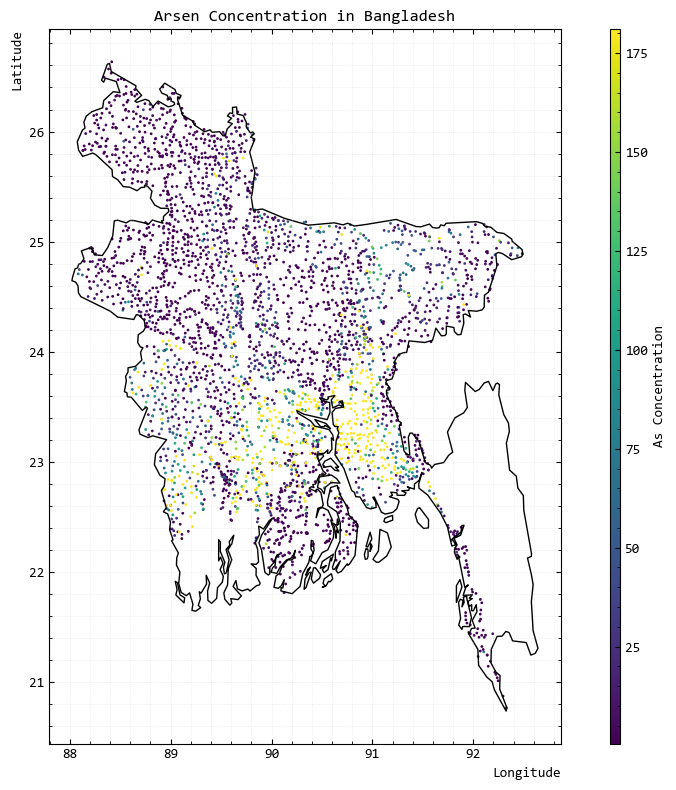

In [170]:
fig, ax = plt.subplots(figsize=(10, 8))
gdf_plot = dg.plot(column='As', cmap='viridis', vmax=np.nanpercentile(dg["As"], 90), vmin=np.nanpercentile(dg["As"], 5), markersize=1, ax=ax)
plt.title('Arsen Concentration in Bangladesh')
shp.plot(ax=gdf_plot, edgecolor='black', facecolor='none')
fig.colorbar(gdf_plot.collections[0], ax=gdf_plot,orientation="vertical",shrink=1,aspect=70,label="As Concentration")
ax.set_xlabel('Longitude',loc="right")
ax.set_ylabel('Latitude',loc="top")
plt.tight_layout()
# ax.set_xticklabels([f'{tick}°' for tick in ax.get_xticks()])
# ax.set_yticklabels([f'{tick}°' for tick in ax.get_yticks()])
plt.show()

In [171]:
gj = shp.to_json()

# Create a Pydeck GeoJsonLayer
poly= pdk.Layer(
        "GeoJsonLayer",
        data=shp,
        get_fill_color=[100,100,100,0],
        get_line_color=[120,120,120,255],  # Border color
        line_width_min_pixels=1.5
    )

# Define a layer to display the points
layer = pdk.Layer(
    'ScatterplotLayer',
    data=dg,
    get_position='[LONG_DEG, LAT_DEG]',
    get_fill_color='[0 + As * 2, 30 + As * 10, 180-As*2, 255]',
    get_radius=1400,
    pickable=True
)

# Set the viewport location
view_state = pdk.ViewState(
    latitude=dg['LAT_DEG'].mean(),
    longitude=dg['LONG_DEG'].mean(),
    zoom=7,
    pitch=0
)

# Render the deck.gl map with a light theme
r = pdk.Deck(
    layers=[poly,layer],
    initial_view_state=view_state,
    map_provider=None,
    height=500,
    tooltip={"text": "{As}"},
    map_style="light_no_labels" 
)
r.to_html('ScatterplotLayer.html',iframe_height=800)

__Coordinate Transormation__

Transform the ellipsoidal coordinates of the dataset into projected (metric) coordinates in adequate regional coordinate system (EPSG:9678 | https://epsg.io/9678)

In [ ]:
# Ellipsoidal Coordinates to Metric CRS
main_crs = "EPSG:9678" # https://epsg.io/9678
dg = dg.to_crs(main_crs)
shp = shp.to_crs(main_crs)

### __Variogramm__

In [173]:
# east = dg.geometry.x
# north = dg.geometry.y

# Position Vector of Observations
x_o = dg.get_coordinates().values # [East , North] # m

n_points = len(x_o[:,0])

print(f"n points: {n_points} observations")

n points: 3419 observations


In [179]:
## Point to Point Distances, for all points

dists = np.linalg.norm(x_o[:,np.newaxis] - x_o[np.newaxis,:],axis=-1)

# Distanzan sind in beide Richtungen deswegen hälftze löschen
dists_half = np.triu(dists) # Diagonale auch null das nicht abstand mit sich selber berücksichtigt wird

In [183]:
## Histogram for Distances
n_bins = 60

select_max_dist = 90 # %


# Histogramm
hist, bin_edges = np.histogram(dists,n_bins,range=(0,np.percentile(dists,select_max_dist)))

# Mean Lag h in each class
bin_centers = (bin_edges[1:]+bin_edges[:-1])/2


## Z Values
z = dg["As"].values
z_diff = z[:,np.newaxis] - z[np.newaxis,:]
z_diff_half = np.triu(z_diff) # Clean that not double distance for every pair


print("-------------")
print("Max used distance:",np.percentile(dists,80)/1000,"km ("+str(select_max_dist)+" %)")
print("-------------")


-------------
Max used distance: 277.12722479298264 km (90 %)
-------------


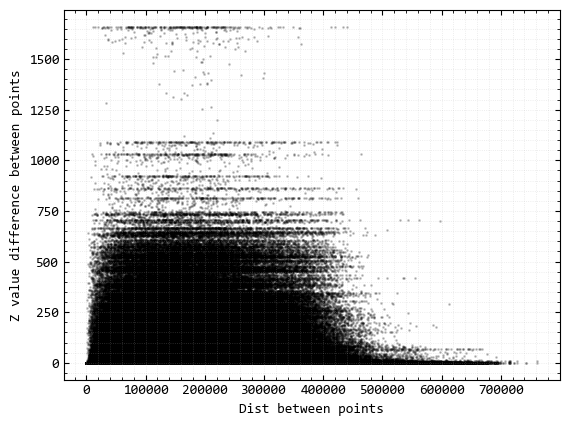

In [185]:
plt.scatter(dists.flatten()[::10],np.abs(z_diff_half.flatten()[::10]),s=1,c="k",alpha=0.2)
plt.xlabel("Dist between points")
plt.ylabel("Z value difference between points")

plt.show()

The Semivarinace is defined as followed:

$$
γ(h)=\frac{1}{2N(h)} \sum_{i=1}^{N}(Z(x_i+h)−Z(x_i))^2
$$

- where $h$ is the distance between points in the lag class
- $N(h)$ is the number of points with the distance h (Number of points per lag class).
- $x_i$ is the position of the i-th point and $Z$ is the attribute value at the position $x_i$

_(Benndorf, 2023)_

Benndorf, Jörg. Angewandte Geodatenanalyse und -Modellierung. 2023. Springer Vieweg Wiesbaden. 978-3-658-39981-8. https://doi.org/10.1007/978-3-658-39981-8

In [ ]:
## Semivariance
semi_var = np.zeros(len(hist)) * np.nan

# Iterate over all lag classes
for i in range(len(hist)):
    
    # Selecting all Z values in the actual Lag Class (h or dist-class)
    diff = z_diff[(dists >= bin_edges[i]) & (dists < bin_edges[i+1])]

    # Count Distances in class
    n = np.sum((dists >= bin_edges[i]) & (dists < bin_edges[i+1]) ) # number of distances in class i
    
    # Semivariance for Class i
    semi_var[i] = 1 / (n*2) * np.sum( diff**2 )

### __Theoretical Variogramm Model Fitting__

In [187]:
# https://scikit-gstat.readthedocs.io/en/latest/technical/fitting.html


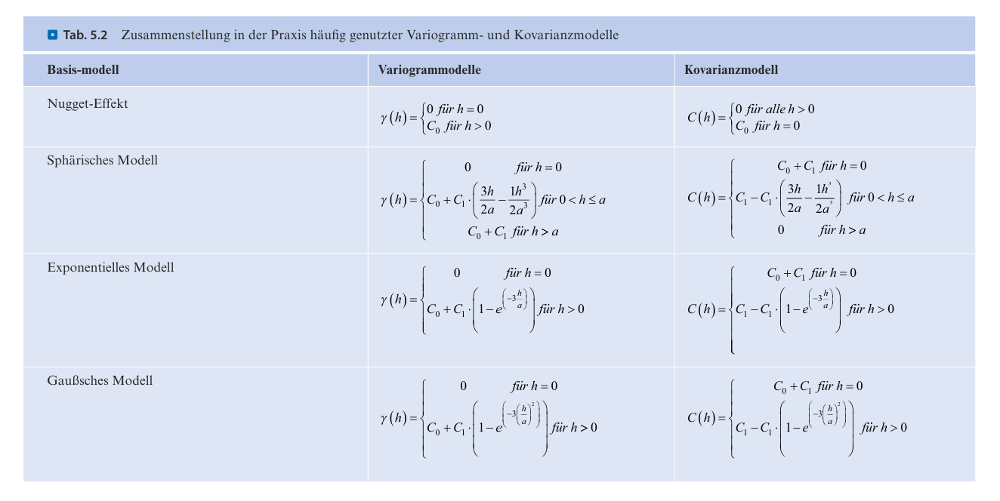

The formula for the spherical variogram model is given by:

$$
\gamma(h) = 
\begin{cases}
0 & \text{if } h = 0 \\
C_0 + C \left[ \frac{3h}{2a} - \frac{1}{2} \left( \frac{h}{a} \right)^3 \right] & \text{if } 0 \leq h \leq a \\
C_0 + C & \text{if } h > a 
\end{cases}
$$

where:
- $h$ is the lag distance,
- $C_0$ is the nugget,
- $C$ is the sill minus the nugget,
- $a$ is the range.

Modified formula to include $C_0$ fo $h=0$ (Wieder rausgenommen wegen theorie zu Covarinace)

In [188]:
def spherical(h, c0, c, a):
    semivar = np.zeros_like(h)
    mask0 = h == 0
    mask1 = (h >0 ) & (h <= a)
    mask2 = h > a
    semivar[mask1] = 0
    semivar[mask1] = c0 + c * (3 * h[mask1] / (2 * a) - 0.5 * (h[mask1] / a) ** 3)
    semivar[mask2] = c0 + c
    return semivar


def spherical_cov(h, c0, c, a):
    covariance = np.zeros_like(h)
    mask1 = (h > 0 ) & (h <= a)
    mask2 = h == 0
    covariance[mask1] = c - c * (3 * h[mask1] / (2 * a) - 0.5 * (h[mask1] / a) ** 3)
    covariance[mask2] = c0 + c # Nugget effect
    # covariance for h > a is already Zero due to covariance initalization as zeros_like
    return covariance


x = bin_centers[1:] # Drop first element to remove peak/disturbance
y = semi_var[1:]
# TODO automate the p0 value selction from expireminetal variogram
# TODO hinzufügen von bounds wie in https://scikit-gstat.readthedocs.io/en/latest/technical/fitting.html
p0 = [0, np.mean(x_o[:,1]), np.mean(x_o[:,0])]

cof_u, cov = curve_fit(spherical, x, y,p0 = p0 )

print(f"Nugget (C_0): {cof_u[0]:.2f}")
print(f"Sill (C_1): {cof_u[1]:.2f}")
print(f"Range (a): {cof_u[2]:.2f}")
print(f"max Var: {cof_u[0]+cof_u[1]:.2f}")

Nugget (C_0): 8601.35
Sill (C_1): 5784.13
Range (a): 71833.55
max Var: 14385.49


In [189]:
np.var(z)

14081.945020559797

__Covariance and Interpolations weights__

The Covariance is derived from the Semmivariance:

$$
Cov(h) = 
\begin{cases} 
C_0 + C & \text{if } h = 0 \\
C - C \left[ \frac{3h}{2a} - \frac{1}{2} \left( \frac{h}{a} \right)^3 \right] & \text{if } 0 < h \leq a \\
0 & \text{if } h > a 
\end{cases}
$$

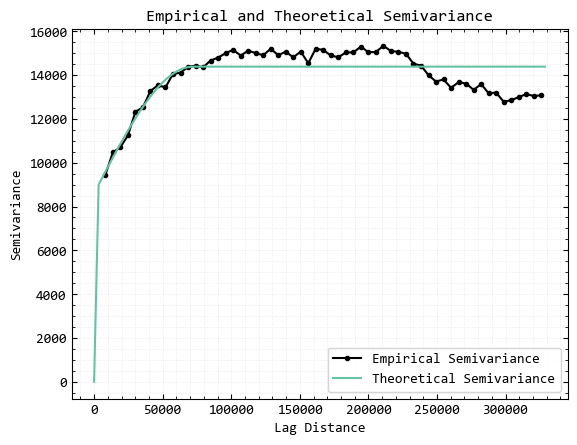

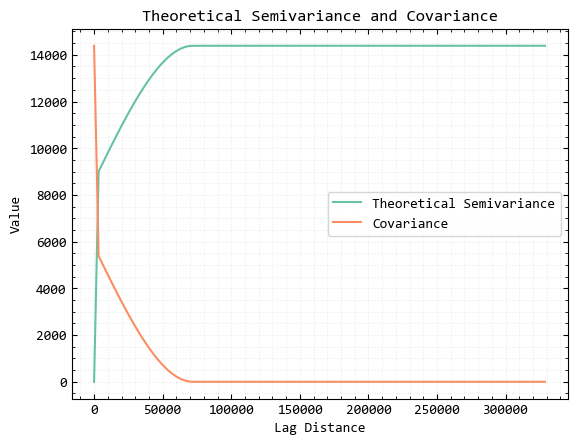

In [190]:
# Plot Spherical Model
h_theo = np.linspace(0,bin_edges.max(),100)
semivar_theo = spherical(h_theo,cof_u[0],cof_u[1],cof_u[2])

cov = spherical_cov(h_theo,cof_u[0],cof_u[1],cof_u[2])

plt.plot(bin_centers[1:], semi_var[1:], marker='o', ms=3, c="k", label='Empirical Semivariance')
plt.plot(h_theo, semivar_theo, label='Theoretical Semivariance')
plt.xlabel('Lag Distance')
plt.ylabel('Semivariance')
plt.title('Empirical and Theoretical Semivariance')
plt.legend()
plt.show()


plt.plot(h_theo, semivar_theo, label='Theoretical Semivariance')
plt.plot(h_theo, cov, label='Covariance')
plt.xlabel('Lag Distance')
plt.ylabel('Value')
plt.title('Theoretical Semivariance and Covariance')
plt.legend()
plt.show()

### __Kriging__

_"Kriging is basically a generalization of minimum mean square error estimation taking into account spatial correlation"_ (B. S. Daya Sagar,Handbook  
of Mathematical 
Geosciences,2018)

__Literature:__
- ArcGis Documentation: https://pro.arcgis.com/en/pro-app/latest/tool-reference/3d-analyst/how-kriging-works.htm
- Gstat: https://scikit-gstat.readthedocs.io/en/latest/userguide/kriging.html
- Handbook of Mathematical Geosciences: https://doi.org/10.1007/978-3-319-78999-6
- Angewandte Geodatenanalyse und -Modellierung: https://doi.org/10.1007/978-3-658-39981-8 





#### __1. Simple Kriging__

The Weigths for the Kriging are Calulated via the Covariance for each interpolation point:

$$
\lambda = \mathbf{C^{-1} \cdot c_0}
$$

the matrizes looks like that:



$$
\lambda =
\begin{bmatrix}
    \lambda_1 \\
    \lambda_2 \\
    \vdots \\
    \lambda_2
\end{bmatrix}, \quad
\mathbf{C} =
\begin{bmatrix}
    \text{Cov}[x_1, x_1] & \text{Cov}[x_1, x_2] & \cdots & \text{Cov}[x_1, x_n] \\
    \text{Cov}[x_2, x_1] & \text{Cov}[x_2, x_2] & \cdots & \text{Cov}[x_2, x_n] \\
    \vdots & \vdots & \ddots & \vdots \\
    \text{Cov}[x_n, x_1] & \text{Cov}[x_n, x_2] & \cdots & \text{Cov}[x_n, x_n]
\end{bmatrix}, \quad
\mathbf{c}_0 =
\begin{bmatrix}
    \text{Cov}(x_1, x_0) \\
    \text{Cov}(x_2, x_0) \\
    \vdots \\
    \text{Cov}(x_n, x_0)
\end{bmatrix}
$$


__Simple Kriging__

$$
Z^*_{SK}(x_0) = \sum_{i=0}^{n} \lambda_i \cdot z(x_i) + \lambda_m \cdot m
$$

$$with$$

$$
\lambda_m = 1 - \sum_{i=0}^{n} \lambda_i.
$$


If we insert $\lambda_m$ and rewrite:

$$

Z^*_{SK}(x_0) = \sum_{i=0}^{n} \lambda_i \cdot z(x_i) + 1\cdot m - \sum_{i=0}^{n} \lambda_i \cdot m
$$

$
\Leftrightarrow  
$
$$Z^*_{SK}(x_0) = \sum_{i=0}^{n} \lambda_i \cdot (z(x_i) -m) + m$$

$
\Leftrightarrow  
$
$$Z^*_{SK}(x_0) = \lambda^{T} \cdot (\mathbf{Z} -m) + m$$


In [191]:
# Map range Bangladesh
n_range = (x_o[:,1].min(),x_o[:,1].max())
e_range = (x_o[:,0].min(),x_o[:,0].max())

# Interpolation Coords
res = 10_000
x_n, x_e = np.mgrid[n_range[0]:n_range[1]:res,e_range[0]:e_range[1]:res]

In [192]:
x_p = np.asarray([x_e.flatten(),x_n.flatten()]) # points of interpolation

x_p = x_p.T # Transverse to make it vertical
# x_p = np.rot90(x_p)

In [193]:
# plt.imshow(x_p[:,0].reshape(x_n.shape),origin="lower")
# plt.colorbar()
# plt.show()

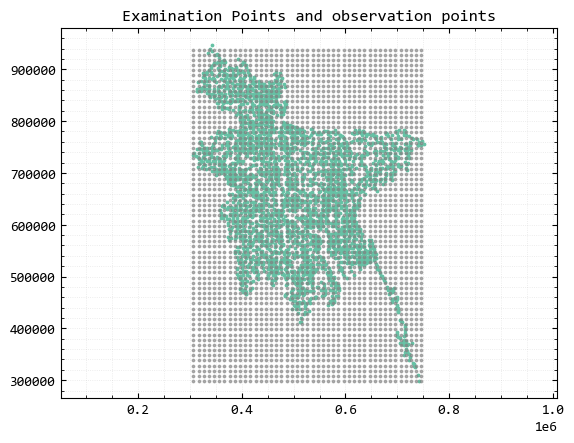

In [194]:
plt.title("Examination Points and observation points")
plt.scatter(x_o[:,0],x_o[:,1],s=3)
plt.scatter(x_p[:,0],x_p[:,1],s=3,c="grey",alpha=0.6)
plt.axis("equal")
plt.show()

In [195]:
# np.linalg.matrix_rank(C)
# 3419
# shape = (3533, 3533)


In [219]:
# Covariance for all Observation Points
C = spherical_cov(dists,cof_u[0],cof_u[1],cof_u[2]) # TODO include local search area to cut computing costs

# Calculating Inverse
C_iv = np.linalg.inv(C) ## TODO Problem mit der Inversen scheinbar?

# Mean to detrend Z
m = z.mean()

In [197]:

# Test C matrix for invertability:
#print("Condition number of C:", np.linalg.cond(C))
print("Reciprocal of machine epsilon:", 1/sys.float_info.epsilon)


Reciprocal of machine epsilon: 4503599627370496.0


In [198]:
##  Most Likely very wrong ##

# Z_sk = np.empty(x_p.shape[0])
# for i in range(x_p.shape[0]):

#     dists_p = np.linalg.norm(x_o[:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
#     c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
    
#     lam = C_iv @ c_0[:, None] # Weights based on cavariance and dinstance (Cov in c_0)
#     lam_m = 1 - np.sum(lam)
#     print(i,lam.max(),lam_m)

#     Z_sk[i] = np.sum( lam * z + lam_m * m ) # interpolated value

In [ ]:
# Z_sk = np.empty(x_p.shape[0])
# for i in range(x_p.shape[0]):

#     dists_p = np.linalg.norm(x_o[:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
#     c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
    
#     lam = C_iv @ c_0[:, None] # Weights based on cavariance and dinstance (Cov in c_0)

#     #lam = np.linalg.solve(C,c_0)

#     #print(i,np.sum(lam))

#     Z_sk[i] = (lam.T @ (z-m) ) + m # interpolated value

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 3419 is different from 0)

In [ ]:
# Z_sk = Z_sk.reshape(x_e.shape)

# fig, ax = plt.subplots(ncols=2, figsize=(14, 7))

# # Plot the raster on the left
# im = ax[0].imshow(Z_sk, origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 90))
# fig.colorbar(im, ax=ax[0])
# ax[0].set_title('Raster Plot')

# # Plot the scattered points on the right
# sc = ax[1].scatter(x_o[:, 0], x_o[:, 1], s=3,c=z,cmap="turbo")
# ax[1].scatter(x_p[:,0],x_p[:,1],s=3,alpha=0.4)
# ax[1].set_title('Scattered Points')
# plt.colorbar(sc,ax=ax[1])
# ax[1].axis("equal")
# ax[1].set_xlim(e_range)
# ax[1].set_ylim(n_range)

# plt.tight_layout()
# plt.show()

3rd Attempt

In [201]:
# Find all Obs points inside the max range
max_range = cof_u[2] * 0.2

print(f"Range (a): {cof_u[2]:.2f} m / {cof_u[2]/1000:.2f} km")
print(f"Search range (radius) Kriging: {max_range:.2f} m / {max_range/1000:.2f} km")


Range (a): 71833.55 m / 71.83 km
Search range (radius) Kriging: 14366.71 m / 14.37 km


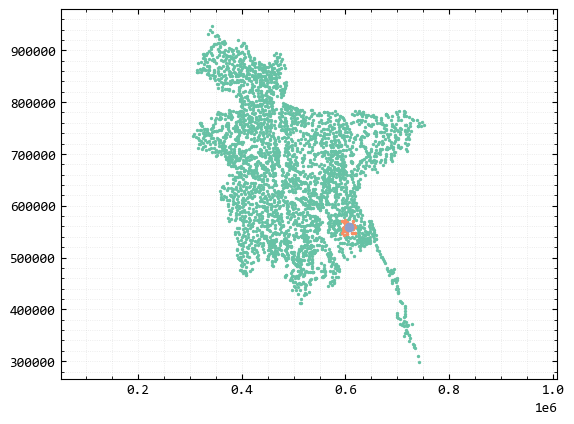

In [203]:
# Example for one itnerpolation point in the grid
i = 1200
neighborhood = (  (x_o[:,0] <= (x_p[i,0] + max_range))  & (x_o[:,0] >= (x_p[i,0] - max_range))  )  & (  (x_o[:,1] <= (x_p[i,1] + max_range))  & (x_o[:,1] >= (x_p[i,1] - max_range))   ) # mask for x & y

plt.scatter(x_o[:,0],x_o[:,1],s=2)
plt.scatter(x_o[neighborhood,0],x_o[neighborhood,1],s=2)

plt.scatter(x_p[i,0],x_p[i,1])
plt.axis("equal")
plt.show()

Z_sk = np.empty(x_p.shape[0]) * np.nan
mu = np.empty(x_p.shape[0]) * np.nan
regularization_param = 1000
for i in [i]:

    # Select Neigborhod of examination/interpolation Point according to range Parameter
    neighborhood = (  (x_o[:,0] <= (x_p[i,0] + max_range))  & (x_o[:,0] >= (x_p[i,0] - max_range))  )  & (  (x_o[:,1] <= (x_p[i,1] + max_range))  & (x_o[:,1] >= (x_p[i,1] - max_range))   ) # mask for x & y

    # Calculate Dists and Covariance for selected Neigborhouds and Interpolation Point
    dists = np.linalg.norm(x_o[neighborhood,np.newaxis] - x_o[np.newaxis,neighborhood],axis=-1)
    C = spherical_cov(dists,cof_u[0],cof_u[1],cof_u[2])
    C_cond = np.ones((C.shape[0]+1,C.shape[1]+1))
    C_cond[:-1,:-1] = C
    C_cond[-1,-1] = 0

    dists_p = np.linalg.norm(x_o[neighborhood,:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
    c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
    c_0_cond = np.ones((c_0.shape[0]+1))
    c_0_cond[:-1] = c_0

    # Check if the matrix is singular
    if C.size == 0:
        print(f"Covariance matrix is empty at index {i}, skipping this point.")
        continue
    if np.linalg.cond(C) < 1/sys.float_info.epsilon:
        #C_cond += regularization_param * np.eye(C.shape[0])
        lam_mu = np.linalg.solve(C_cond, c_0_cond)
    else:
        print(f"Matrix is singular at index {i}, skipping this point.")
        print(np.linalg.cond(C), 1/sys.float_info.epsilon)
        continue
    
    mu[i] = lam_mu[-1] # Last element is lagrange multiplicator
    #print(i,np.sum(lam))

    Z_sk[i] = lam_mu[:-1].T @ z[neighborhood]  # interpolated value



In [205]:
duplicates[0]

array([[20.769 , 92.326 ],
       [20.875 , 92.295 ],
       [21.014 , 92.246 ],
       ...,
       [26.5296, 88.4111],
       [26.5673, 88.3841],
       [26.6332, 88.4156]])

In [206]:
duplicates[1]

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [207]:
# Check for exact duplicates in x_o
duplicates = np.unique(x_o, axis=0, return_counts=True)
duplicate_coords = duplicates[0][duplicates[1] > 1]
duplicate_counts = duplicates[1][duplicates[1] > 1]

# Print the duplicate coordinates and their counts
# for coord, count in zip(duplicate_coords, duplicate_counts):
#     print(f"Coordinate {coord} is duplicated {count} times.")

In [210]:
print(f"Min of C: {C.min()}")
print(f"Max of C: {C.max()}")
print(f"Mean of C: {C.mean()}")
print(f"Std of C: {C.std()}")


Min of C: 2021.4095262690585
Max of C: 14385.48701975638
Mean of C: 4383.591626528761
Std of C: 2140.055095389767


__Improve the Conditioning of C:__

The bad conditioning of the matrix ( C ) in your code can be caused by several factors, including:

Collinearity: If the points in the neighborhood are very close to each other or lie on a straight line, the covariance matrix ( C ) can become nearly singular.


Small Variance: If the variance of the data points is very small, the covariance values can be very close to each other, leading to a poorly conditioned matrix.


Range Parameter: If the max_range parameter is too large, it might include points that are not relevant, leading to a covariance matrix that is difficult to invert.
Strategies to Fix It

Regularization: Add a small value to the diagonal of the covariance matrix to improve its conditioning. This technique is known as Tikhonov regularization or ridge regression.

Neighborhood Selection: Ensure that the neighborhood selection is appropriate and does not include too many points or points that are too far away.

Check for Collinearity: Ensure that the points in the neighborhood are not collinear. You can use techniques like Principal Component Analysis (PCA) to check for collinearity.

Scaling: Normalize or standardize the data points before computing the covariance matrix to ensure that the values are within a reasonable range.

In [222]:
# Mean to detrend Z
m = z.mean()

Z_sk = np.empty(x_p.shape[0]) * np.nan
for i in range(x_p.shape[0]):

    # Select Neigborhod of examination/interpolation Point according to range Parameter
    neighborhood = (  (x_o[:,0] <= (x_p[i,0] + max_range))  & (x_o[:,0] >= (x_p[i,0] - max_range))  )  & (  (x_o[:,1] <= (x_p[i,1] + max_range))  & (x_o[:,1] >= (x_p[i,1] - max_range))   ) # mask for x & y

    # Calculate Dists and Covariance for selected Neigborhouds and Interpolation Point
    dists = np.linalg.norm(x_o[neighborhood,np.newaxis] - x_o[np.newaxis,neighborhood],axis=-1)
    C = spherical_cov(dists,cof_u[0],cof_u[1],cof_u[2])
    
    dists_p = np.linalg.norm(x_o[neighborhood,:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
    c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
    

    # Check if the matrix is singular
    if C.size == 0:
        #print(f"Covariance matrix is empty at index {i}, skipping this point.")
        continue
    if np.linalg.cond(C) < 1/sys.float_info.epsilon:
        lam = np.linalg.solve(C, c_0)
    else:
        #print(f"Matrix is singular at index {i}, skipping this point.")
        #print(np.linalg.cond(C), 1/sys.float_info.epsilon)
        continue

    #print(i,np.sum(lam))

    Z_sk[i] = (lam.T @ (z[neighborhood]-m) ) + m # interpolated value

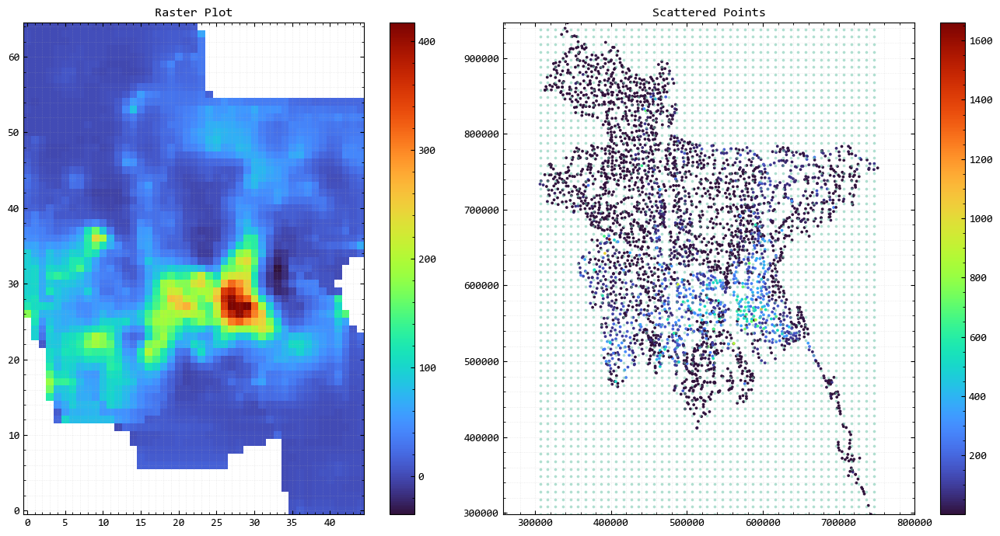

In [226]:
Z_sk = Z_sk.reshape(x_e.shape)

fig, ax = plt.subplots(ncols=2, figsize=(14, 7))

# Plot the raster on the left
im = ax[0].imshow(Z_sk, origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 100))
fig.colorbar(im, ax=ax[0])
ax[0].set_title('Raster Plot')

# Plot the scattered points on the right
sc = ax[1].scatter(x_o[:, 0], x_o[:, 1], s=3,c=z,cmap="turbo")
ax[1].scatter(x_p[:,0],x_p[:,1],s=3,alpha=0.4)
ax[1].set_title('Scattered Points')
plt.colorbar(sc,ax=ax[1])
ax[1].axis("equal")
ax[1].set_xlim(e_range)
ax[1].set_ylim(n_range)

plt.tight_layout()
plt.show()


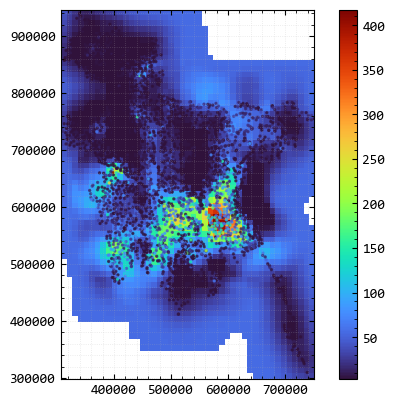

In [224]:
im = plt.imshow(Z_sk,origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 6), vmax=np.nanpercentile(Z_sk,100), extent=[e_range[0], e_range[1], n_range[0], n_range[1]])
plt.scatter(x_o[:,0],x_o[:,1],cmap="turbo",c=z,s=2,alpha=0.7)
plt.colorbar(im)
plt.show()


4th attempt (Try: include constrain  $\lambda=1$ for solving $C * \lambda = c_o$)

Ordinary Kringing with:


$$
\sum_{i=0}^{n} \lambda_i \overset{!}{=} 1
$$

The Matrix form with the condition:

$$
\lambda =
\begin{bmatrix}
\lambda_1 \\
\lambda_2 \\
\vdots \\
\lambda_n \\
\mu_{OK}
\end{bmatrix},
\quad
\mathbf{C} =
\begin{bmatrix}
\text{Cov}[x_1, x_1] & \text{Cov}[x_1, x_2] & \dots & \text{Cov}[x_1, x_n] & 1 \\
\text{Cov}[x_2, x_1] & \text{Cov}[x_2, x_2] & \dots & \text{Cov}[x_2, x_n] & 1 \\
\vdots & \vdots & \ddots & \vdots & \vdots \\
\text{Cov}[x_n, x_1] & \text{Cov}[x_n, x_2] & \dots & \text{Cov}[x_n, x_n] & 1 \\
1 & 1 & \dots & 1 & 0
\end{bmatrix},
\quad
\mathbf{C_0} =
\begin{bmatrix}
\text{Cov}(x_1, x_0) \\
\text{Cov}(x_2, x_0) \\
\vdots \\
\text{Cov}(x_n, x_0) \\
1
\end{bmatrix}
$$


35 1
36 6
37 11
38 13
39 13
40 13
41 13
42 13
43 13
44 13
80 1
81 8
82 13
83 15
84 15
85 15
86 15
87 15
88 15
89 15
125 5
126 15
127 21
128 23
129 23
130 23
131 23
132 23
133 23
134 23
169 1
170 9
171 20
172 26
173 28
174 28
175 28
176 28
177 28
178 28
179 28
214 4
215 12
216 25
217 31
218 33
219 33
220 33
221 33
222 33
223 33
224 33
259 4
260 12
261 27
262 33
263 35
264 35
265 35
266 35
267 35
268 35
269 35
285 2
286 2
287 2
288 2
289 2
290 2
291 2
292 2
293 2
294 2
295 2
296 2
304 4
305 14
306 30
307 36
308 37
309 37
310 37
311 37
312 37
313 37
314 37
330 2
331 3
332 3
333 3
334 3
335 3
336 3
337 3
338 3
339 3
340 3
341 3
349 4
350 15
351 31
352 37
353 37
354 37
355 37
356 37
357 37
358 37
359 37
375 3
376 6
377 8
378 8
379 8
380 8
381 8
382 8
383 8
384 8
385 8
386 8
387 4
388 1
394 7
395 18
396 34
397 40
398 40
399 40
400 40
401 40
402 40
403 40
404 40
419 3
420 9
421 14
422 16
423 16
424 16
425 16
426 17
427 17
428 17
429 17
430 16
431 12
432 7
433 2
434 1
435 1
436 1
439 11
440 22

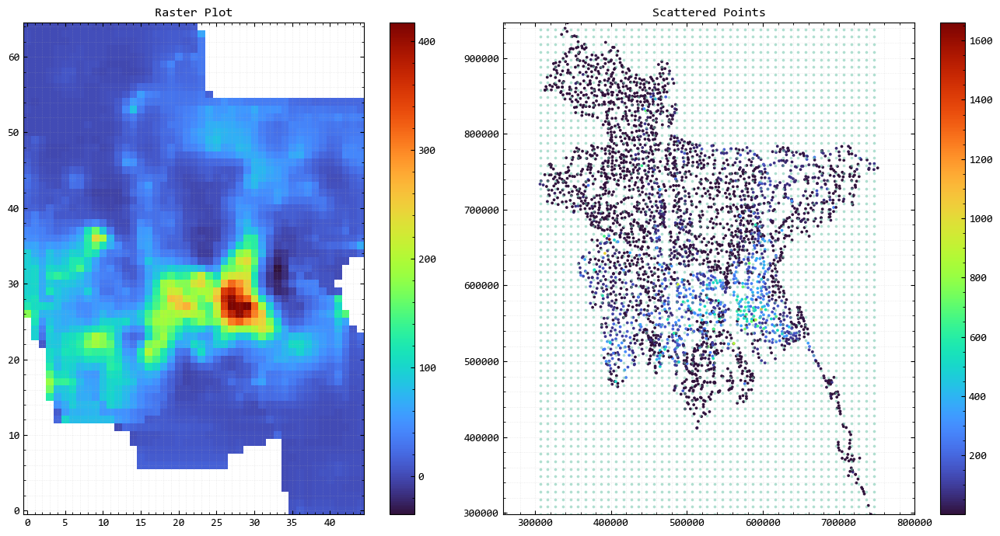

In [ ]:
max_range = cof_u[2] * 1

Z_ok = np.empty(x_p.shape[0]) * np.nan
mu = np.empty(x_p.shape[0]) * np.nan
for i in range(x_p.shape[0]):

    # Select Neigborhod of examination/interpolation Point according to range Parameter
    neighborhood = (  (x_o[:,0] <= (x_p[i,0] + max_range))  & (x_o[:,0] >= (x_p[i,0] - max_range))  )  & (  (x_o[:,1] <= (x_p[i,1] + max_range))  & (x_o[:,1] >= (x_p[i,1] - max_range))   ) # mask for x & y

    # Calculate Dists and Covariance for selected Neigborhouds and Interpolation Point
    dists = np.linalg.norm(x_o[neighborhood,np.newaxis] - x_o[np.newaxis,neighborhood],axis=-1)
    C = spherical_cov(dists,cof_u[0],cof_u[1],cof_u[2])
    C_cond = np.ones((C.shape[0]+1,C.shape[1]+1))
    C_cond[:-1,:-1] = C
    C_cond[-1,-1] = 0

    dists_p = np.linalg.norm(x_o[neighborhood,:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
    c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
    c_0_cond = np.ones((c_0.shape[0]+1))
    c_0_cond[:-1] = c_0

    # Check if the matrix is singular
    if C.size == 0:
        #print(f"Covariance matrix is empty at index {i}, skipping this point.")
        continue
    if np.linalg.cond(C) < 1/sys.float_info.epsilon:
        lam_mu = np.linalg.solve(C_cond, c_0_cond)
        print(i,neighborhood.sum())
    else:
        print(f"Matrix is singular at index {i}, skipping this point.")
        print(np.linalg.cond(C), 1/sys.float_info.epsilon)
        continue
    
    mu[i] = lam_mu[-1] # Last element is lagrange multiplicator
    #print(i,np.sum(lam))

    Z_sk[i] = lam_mu[:-1].T @ z[neighborhood]  # interpolated value


Z_ok = Z_ok.reshape(x_e.shape)

fig, ax = plt.subplots(ncols=2, figsize=(14, 7))

# Plot the raster on the left
im = ax[0].imshow(Z_ok, origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 100))
fig.colorbar(im, ax=ax[0])
ax[0].set_title('Raster Plot')

# Plot the scattered points on the right
sc = ax[1].scatter(x_o[:, 0], x_o[:, 1], s=3,c=z,cmap="turbo")
ax[1].scatter(x_p[:,0],x_p[:,1],s=3,alpha=0.4)
ax[1].set_title('Scattered Points')
plt.colorbar(sc,ax=ax[1])
ax[1].axis("equal")
ax[1].set_xlim(e_range)
ax[1].set_ylim(n_range)

plt.tight_layout()
plt.show()

#### __2. Indikator Kriging__

A.G. Journel, 1983, "Nonparametric estimation of spatial distributions", https://link.springer.com/article/10.1007/BF01031292

In [227]:
z.min()

0.5

In [229]:
z.max()

1660.0

In [238]:
thresholds = np.linspace(z.min(),np.percentile(z,99),10)
thresholds

array([5.00000000e-01, 6.28288889e+01, 1.25157778e+02, 1.87486667e+02,
       2.49815556e+02, 3.12144444e+02, 3.74473333e+02, 4.36802222e+02,
       4.99131111e+02, 5.61460000e+02])

In [242]:
sets_x_o = []
sets_z_bool = []

for i in range(len(thresholds)):
    sets_x_o.append( x_o[z>=thresholds[i],:] )
    sets_z_bool.append( z>=thresholds[i] )
    print(i,len(z>=thresholds[i]),np.sum(z>=thresholds[i]))

0 3419 3419
1 3419 747
2 3419 469
3 3419 331
4 3419 233
5 3419 162
6 3419 119
7 3419 87
8 3419 63
9 3419 35


In [ ]:
## Point to Point Distances, for all points

dists = np.linalg.norm(x_o[:,np.newaxis] - x_o[np.newaxis,:],axis=-1)

# Distanzan sind in beide Richtungen deswegen hälftze löschen
dists_half = np.triu(dists) # Diagonale auch null das nicht abstand mit sich selber berücksichtigt wird

## Histogram for Distances
n_bins = 60

select_max_dist = 90 # %


# Histogramm
hist, bin_edges = np.histogram(dists,n_bins,range=(0,np.percentile(dists,select_max_dist)))

# Mean Lag h in each class
bin_centers = (bin_edges[1:]+bin_edges[:-1])/2


## Z Values
z = dg["As"].values
z_diff = z[:,np.newaxis] - z[np.newaxis,:]
z_diff_half = np.triu(z_diff) # Clean that not double distance for every pair


print("-------------")
print("Max used distance:",np.percentile(dists,80)/1000,"km ("+str(select_max_dist)+" %)")
print("-------------")


In [ ]:
## Semivariance
semi_var = np.zeros(len(hist)) * np.nan

# Iterate over all lag classes
for i in range(len(hist)):
    
    # Selecting all Z values in the actual Lag Class (h or dist-class)
    diff = z_diff[(dists >= bin_edges[i]) & (dists < bin_edges[i+1])]

    # Count Distances in class
    n = np.sum((dists >= bin_edges[i]) & (dists < bin_edges[i+1]) ) # number of distances in class i
    
    # Semivariance for Class i
    semi_var[i] = 1 / (n*2) * np.sum( diff**2 )

In [ ]:

max_range = cof_u[2] * 1

Z_sk = np.empty(x_p.shape[0]) * np.nan
mu = np.empty(x_p.shape[0]) * np.nan
for i in range(x_p.shape[0]):

    # Select Neigborhod of examination/interpolation Point according to range Parameter
    neighborhood = (  (x_o[:,0] <= (x_p[i,0] + max_range))  & (x_o[:,0] >= (x_p[i,0] - max_range))  )  & (  (x_o[:,1] <= (x_p[i,1] + max_range))  & (x_o[:,1] >= (x_p[i,1] - max_range))   ) # mask for x & y

    # Calculate Dists and Covariance for selected Neigborhouds and Interpolation Point
    dists = np.linalg.norm(x_o[neighborhood,np.newaxis] - x_o[np.newaxis,neighborhood],axis=-1)
    C = spherical_cov(dists,cof_u[0],cof_u[1],cof_u[2])
    C_cond = np.ones((C.shape[0]+1,C.shape[1]+1))
    C_cond[:-1,:-1] = C
    C_cond[-1,-1] = 0

    dists_p = np.linalg.norm(x_o[neighborhood,:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
    c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
    c_0_cond = np.ones((c_0.shape[0]+1))
    c_0_cond[:-1] = c_0

    # Check if the matrix is singular
    if C.size == 0:
        #print(f"Covariance matrix is empty at index {i}, skipping this point.")
        continue
    if np.linalg.cond(C) < 1/sys.float_info.epsilon:
        lam_mu = np.linalg.solve(C_cond, c_0_cond)
        print(i,neighborhood.sum())
    else:
        print(f"Matrix is singular at index {i}, skipping this point.")
        print(np.linalg.cond(C), 1/sys.float_info.epsilon)
        continue
    
    mu[i] = lam_mu[-1] # Last element is lagrange multiplicator
    #print(i,np.sum(lam))

    Z_sk[i] = lam_mu[:-1].T @ z[neighborhood]  # interpolated value


Z_sk = Z_sk.reshape(x_e.shape)

fig, ax = plt.subplots(ncols=2, figsize=(14, 7))

# Plot the raster on the left
im = ax[0].imshow(Z_sk, origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 100))
fig.colorbar(im, ax=ax[0])
ax[0].set_title('Raster Plot')

# Plot the scattered points on the right
sc = ax[1].scatter(x_o[:, 0], x_o[:, 1], s=3,c=z,cmap="turbo")
ax[1].scatter(x_p[:,0],x_p[:,1],s=3,alpha=0.4)
ax[1].set_title('Scattered Points')
plt.colorbar(sc,ax=ax[1])
ax[1].axis("equal")
ax[1].set_xlim(e_range)
ax[1].set_ylim(n_range)

plt.tight_layout()
plt.show()